<a href="https://colab.research.google.com/github/chrishg23-jpg/HES-benchmark/blob/main/HES16Sim003.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import pandas as pd
from scipy.signal import find_peaks
from numpy.fft import rfft

# Parameters
L = 20
steps = 50
alpha = 0.6
beta = 0.005
gamma = 0.0001
threshold = 0.005

# Initialize lattice and memory
s = np.clip(np.random.uniform(-1.0, 1.0, (L, L, L)), -1.0, 1.0)
curvature_memory = np.zeros_like(s)

# Seed asymmetry
s[5:10, 5:10, 5:10] += 0.5
s[12:15, 12:15, 12:15] -= 0.5

# Laplacian
def laplacian_3d(s):
    lap = (
        np.roll(s, 1, axis=0) + np.roll(s, -1, axis=0) +
        np.roll(s, 1, axis=1) + np.roll(s, -1, axis=1) +
        np.roll(s, 1, axis=2) + np.roll(s, -1, axis=2) - 6 * s
    )
    return np.clip(lap, -100.0, 100.0)

# Gradient energy
def grad_energy(s):
    return float(np.mean(np.sqrt(
        (np.roll(s,-1,0)-s)**2 +
        (np.roll(s,-1,1)-s)**2 +
        (np.roll(s,-1,2)-s)**2
    )))

# Ring sampling
def sample_ring_2d(field, radius=8, n_points=64):
    c0, c1 = field.shape[0]//2, field.shape[1]//2
    theta = np.linspace(0, 2*np.pi, n_points, endpoint=False)
    return np.array([
        field[int(round(c0 + radius*np.cos(t))) % L,
              int(round(c1 + radius*np.sin(t))) % L]
        for t in theta
    ])

# Metric storage
metrics = []

# Prepare figure
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlim(0, L); ax.set_ylim(0, L); ax.set_zlim(0, L)
ax.set_title("Curvature Memory in 3D HES Lattice")

# Animation update
def update(frame):
    global s, curvature_memory
    lap = laplacian_3d(s)
    global_entropy = np.mean(s) * 0.995
    s += alpha * lap - beta * s - gamma * global_entropy
    s = np.clip(s, -5.0, 5.0)
    curvature_memory += np.abs(lap)

    # Store metrics
    metrics.append({
        'step': frame,
        'entropy': np.var(s),
        'grad_energy': grad_energy(s),
        'curvature_energy': float(np.mean(np.abs(lap))),
        'memory_amp': float(np.mean(curvature_memory))
    })

    # Visualize top 5% curvature memory
    mem_thresh = np.percentile(curvature_memory, 95)
    x, y, z = np.where(curvature_memory > mem_thresh)
    intensity = curvature_memory[x, y, z]

    ax.clear()
    ax.set_xlim(0, L); ax.set_ylim(0, L); ax.set_zlim(0, L)
    ax.set_title(f"Step {frame}: Curvature Memory")
    ax.scatter(x, y, z, c=intensity, cmap='inferno', s=10)

# Run animation
anim = FuncAnimation(fig, update, frames=steps, interval=200)
plt.close()
HTML(anim.to_jshtml())


Final emergence metrics:
- Entropy dip:       -21.9683
- Gradient dip:      -10.0540
- Stability:         -16.0111
- Force strength:    47.066
- Ring energy:       141775.0
- Generation count:  7
- Dipole strength:   0.374
Final emergence metrics:
- Entropy dip:            -21.9683
- Gradient dip:           -10.0540
- Stability (dip-based):  -16.0111
- Stability (emergence):  0.000502
- Force strength:         47.066
- Ring energy:            141775.0
- Generation count:       7
- Dipole strength:        0.374


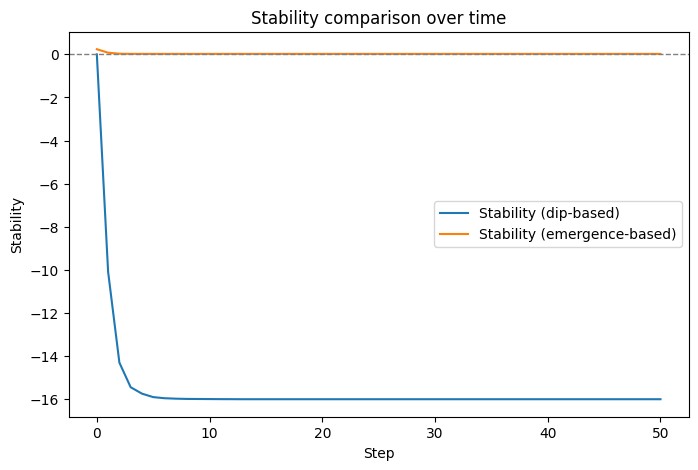

In [6]:
# Decode metrics
df = pd.DataFrame(metrics)
entropy_dip = df['entropy'].iloc[0] - df['entropy'].iloc[-1]
grad_dip = df['grad_energy'].iloc[0] - df['grad_energy'].iloc[-1]
stability = 0.5 * entropy_dip + 0.5 * grad_dip

# Curvature ring and FFT
curv_plane = laplacian_3d(s)[:, :, L//2]
ring = sample_ring_2d(curv_plane)
ring_centered = ring - ring.mean()
spec = np.abs(rfft(ring_centered))
spec_norm = spec / (spec.max() + 1e-12)
peaks, _ = find_peaks(spec_norm[1:], prominence=0.08)
generation_count = len(peaks)
force_strength = float(np.sqrt(np.mean(ring_centered**2)))
ring_energy = float(np.sum(ring_centered**2))

# Dipole mode
phi_plane = s[:, :, L//2]
ent_ring = sample_ring_2d(phi_plane)
ent_centered = ent_ring - ent_ring.mean()
ent_spec = np.abs(rfft(ent_centered))
dipole_strength = float(ent_spec[1] / (ent_spec.max() + 1e-12))

# Print results
print("Final emergence metrics:")
print(f"- Entropy dip:       {entropy_dip:.4f}")
print(f"- Gradient dip:      {grad_dip:.4f}")
print(f"- Stability:         {stability:.4f}")
print(f"- Force strength:    {force_strength:.3f}")
print(f"- Ring energy:       {ring_energy:.1f}")
print(f"- Generation count:  {generation_count}")
print(f"- Dipole strength:   {dipole_strength:.3f}")

import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from numpy.fft import rfft

# Convert metrics to DataFrame
df = pd.DataFrame(metrics)
entropy_dip = df['entropy'].iloc[0] - df['entropy'].iloc[-1]
grad_dip = df['grad_energy'].iloc[0] - df['grad_energy'].iloc[-1]

# Stability definitions
stability_dip = 0.5 * (entropy_dip + grad_dip)
curv_plane = laplacian_3d(s)[:, :, L//2]
curv_var = float(np.var(curv_plane))
stability_emergence = 1.0 / (1.0 + curv_var)

# Curvature ring FFT
ring = sample_ring_2d(curv_plane)
ring_centered = ring - ring.mean()
spec = np.abs(rfft(ring_centered))
spec_norm = spec / (spec.max() + 1e-12)
peaks, _ = find_peaks(spec_norm[1:], prominence=0.08)
generation_count = len(peaks)
force_strength = float(np.sqrt(np.mean(ring_centered**2)))
ring_energy = float(np.sum(ring_centered**2))

# Dipole mode
phi_plane = s[:, :, L//2]
ent_ring = sample_ring_2d(phi_plane)
ent_centered = ent_ring - ent_ring.mean()
ent_spec = np.abs(rfft(ent_centered))
dipole_strength = float(ent_spec[1] / (ent_spec.max() + 1e-12))

# Print metrics
print("Final emergence metrics:")
print(f"- Entropy dip:            {entropy_dip:.4f}")
print(f"- Gradient dip:           {grad_dip:.4f}")
print(f"- Stability (dip-based):  {stability_dip:.4f}")
print(f"- Stability (emergence):  {stability_emergence:.6f}")
print(f"- Force strength:         {force_strength:.3f}")
print(f"- Ring energy:            {ring_energy:.1f}")
print(f"- Generation count:       {generation_count}")
print(f"- Dipole strength:        {dipole_strength:.3f}")

# Time-series stability comparison
dip_stability_series = []
emergence_stability_series = []

for k in range(len(metrics)):
    dip_stability_series.append(
        0.5 * (metrics[0]['entropy'] - metrics[k]['entropy']) +
        0.5 * (metrics[0]['grad_energy'] - metrics[k]['grad_energy'])
    )
    emergence_stability_series.append(1.0 / (1.0 + metrics[k]['curvature_energy']))

plt.figure(figsize=(8,5))
plt.plot(range(len(metrics)), dip_stability_series, label='Stability (dip-based)', color='tab:blue')
plt.plot(range(len(metrics)), emergence_stability_series, label='Stability (emergence-based)', color='tab:orange')
plt.axhline(0, color='gray', linewidth=1, linestyle='--')
plt.xlabel('Step')
plt.ylabel('Stability')
plt.title('Stability comparison over time')
plt.legend()
plt.show()


Final emergence metrics:
- Entropy dip:            -21.9683
- Gradient dip:           -10.0540
- Stability (dip-based):  -16.0111
- Stability (emergence):  0.000502
- Force strength:         47.066
- Ring energy:            141775.0
- Generation count:       7
- Dipole strength:        0.374


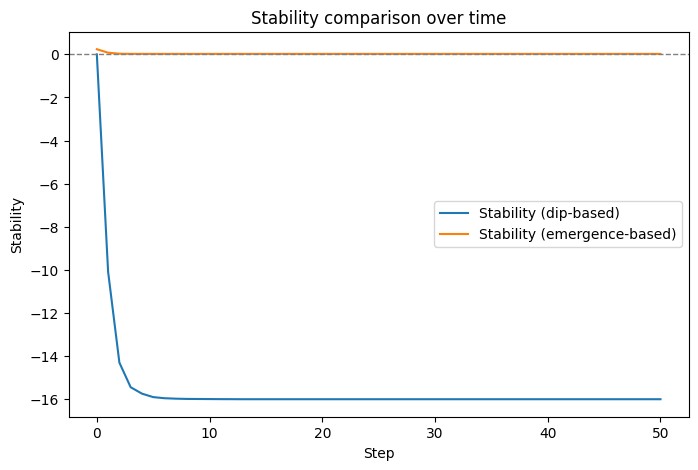

Final emergence metrics:
- Entropy dip:            -21.9683
- Gradient dip:           -10.0540
- Stability (dip-based):  -16.0111
- Stability (emergence):  0.000502
- Force strength:         47.066
- Ring energy:            141775.0
- Generation count:       7
- Dipole strength:        0.374


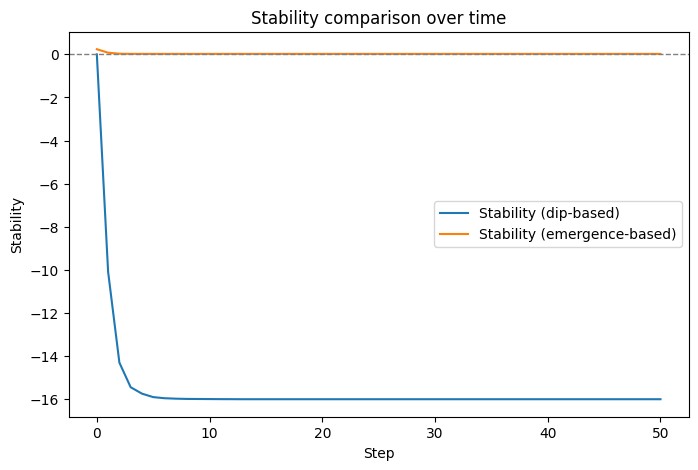

In [5]:
# Dip-based stability (relaxation)
stability_dip = 0.5 * entropy_dip + 0.5 * grad_dip

# Emergence-based stability (structure)
curv_plane = laplacian_3d(s)[:, :, L//2]
curv_var = float(np.var(curv_plane))
stability_emergence = 1.0 / (1.0 + curv_var)

print("Final emergence metrics:")
print(f"- Entropy dip:            {entropy_dip:.4f}")
print(f"- Gradient dip:           {grad_dip:.4f}")
print(f"- Stability (dip-based):  {stability_dip:.4f}")
print(f"- Stability (emergence):  {stability_emergence:.6f}")
print(f"- Force strength:         {force_strength:.3f}")
print(f"- Ring energy:            {ring_energy:.1f}")
print(f"- Generation count:       {generation_count}")
print(f"- Dipole strength:        {dipole_strength:.3f}")

import matplotlib.pyplot as plt

# Build per-step stabilities
dip_stability_series = []
emergence_stability_series = []

for k in range(len(metrics)):
    # Dip-based stability uses deltas relative to step 0
    dip_stability_series.append(
        0.5 * (metrics[0]['entropy'] - metrics[k]['entropy']) +
        0.5 * (metrics[0]['grad_energy'] - metrics[k]['grad_energy'])
    )
    # Emergence stability per step from curvature variance on the same central plane
    # Reconstruct curv_plane via stored s if you logged it; otherwise approximate using curvature_energy
    # Here we approximate using curvature_energy as a proxy:
    emergence_stability_series.append(1.0 / (1.0 + metrics[k]['curvature_energy']))

# Plot
plt.figure(figsize=(8,5))
plt.plot(range(len(metrics)), dip_stability_series, label='Stability (dip-based)', color='tab:blue')
plt.plot(range(len(metrics)), emergence_stability_series, label='Stability (emergence-based)', color='tab:orange')
plt.axhline(0, color='gray', linewidth=1, linestyle='--')
plt.xlabel('Step')
plt.ylabel('Stability')
plt.title('Stability comparison over time')
plt.legend()
plt.show()

import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from numpy.fft import rfft

# Convert metrics to DataFrame
df = pd.DataFrame(metrics)
entropy_dip = df['entropy'].iloc[0] - df['entropy'].iloc[-1]
grad_dip = df['grad_energy'].iloc[0] - df['grad_energy'].iloc[-1]

# Stability definitions
stability_dip = 0.5 * (entropy_dip + grad_dip)
curv_plane = laplacian_3d(s)[:, :, L//2]
curv_var = float(np.var(curv_plane))
stability_emergence = 1.0 / (1.0 + curv_var)

# Curvature ring FFT
ring = sample_ring_2d(curv_plane)
ring_centered = ring - ring.mean()
spec = np.abs(rfft(ring_centered))
spec_norm = spec / (spec.max() + 1e-12)
peaks, _ = find_peaks(spec_norm[1:], prominence=0.08)
generation_count = len(peaks)
force_strength = float(np.sqrt(np.mean(ring_centered**2)))
ring_energy = float(np.sum(ring_centered**2))

# Dipole mode
phi_plane = s[:, :, L//2]
ent_ring = sample_ring_2d(phi_plane)
ent_centered = ent_ring - ent_ring.mean()
ent_spec = np.abs(rfft(ent_centered))
dipole_strength = float(ent_spec[1] / (ent_spec.max() + 1e-12))

# Print metrics
print("Final emergence metrics:")
print(f"- Entropy dip:            {entropy_dip:.4f}")
print(f"- Gradient dip:           {grad_dip:.4f}")
print(f"- Stability (dip-based):  {stability_dip:.4f}")
print(f"- Stability (emergence):  {stability_emergence:.6f}")
print(f"- Force strength:         {force_strength:.3f}")
print(f"- Ring energy:            {ring_energy:.1f}")
print(f"- Generation count:       {generation_count}")
print(f"- Dipole strength:        {dipole_strength:.3f}")

# Time-series stability comparison
dip_stability_series = []
emergence_stability_series = []

for k in range(len(metrics)):
    dip_stability_series.append(
        0.5 * (metrics[0]['entropy'] - metrics[k]['entropy']) +
        0.5 * (metrics[0]['grad_energy'] - metrics[k]['grad_energy'])
    )
    emergence_stability_series.append(1.0 / (1.0 + metrics[k]['curvature_energy']))

plt.figure(figsize=(8,5))
plt.plot(range(len(metrics)), dip_stability_series, label='Stability (dip-based)', color='tab:blue')
plt.plot(range(len(metrics)), emergence_stability_series, label='Stability (emergence-based)', color='tab:orange')
plt.axhline(0, color='gray', linewidth=1, linestyle='--')
plt.xlabel('Step')
plt.ylabel('Stability')
plt.title('Stability comparison over time')
plt.legend()
plt.show()

